In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
print('No. of Row:', df.shape[0])
print('No. of column:',df.shape[1])

No. of Row: 8425
No. of column: 23


In [5]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [6]:
df.shape

(8425, 23)

In [7]:
df['Date'] = pd.to_datetime(df['Date'])

df['day'] = df['Date'].dt.day
df['month'] = df['Date'].dt.month
df['year'] = df['Date'].dt.year

In [8]:
df.drop(['Date'],axis=1,inplace=True)

In [9]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [10]:
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow'] = df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [11]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [12]:
df['Evaporation'] = df['Evaporation'].fillna(df['Evaporation'].mean())
df['Rainfall'] = df['Rainfall'].fillna(df['Rainfall'].mean())
df['Sunshine'] = df['Sunshine'].fillna(df['Sunshine'].mean())
df['WindGustSpeed'] = df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())
df['WindSpeed9am'] = df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())
df['WindSpeed3pm'] = df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())
df['Humidity9am'] = df['Humidity9am'].fillna(df['Humidity9am'].mean())
df['Humidity3pm'] = df['Humidity3pm'].fillna(df['Humidity3pm'].mean())
df['Pressure9am'] = df['Pressure9am'].fillna(df['Pressure9am'].mean())
df['Pressure3pm'] = df['Pressure3pm'].fillna(df['Pressure3pm'].mean())
df['Cloud9am'] = df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm'] = df['Cloud3pm'].fillna(df['Cloud3pm'].mean())
df['Temp9am'] = df['Temp9am'].fillna(df['Temp9am'].mean())
df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())
df['Cloud9am'] = df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['MinTemp'] = df['MinTemp'].fillna(df['MinTemp'].mean())
df['MaxTemp'] = df['MaxTemp'].fillna(df['MaxTemp'].mean())

In [13]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
day              0
month            0
year             0
dtype: int64

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,8425.0,13.193305,5.379488,-2.0,9.300000,13.200000,17.300000,28.5
MaxTemp,8425.0,23.859976,6.114516,8.2,19.300000,23.300000,28.000000,45.5
Rainfall,8425.0,2.805913,10.309308,0.0,0.000000,0.000000,1.400000,371.0
Evaporation,8425.0,5.389395,3.852004,0.0,4.000000,5.389395,5.389395,145.0
Sunshine,8425.0,7.632205,2.825451,0.0,7.632205,7.632205,8.900000,13.9
WindGustSpeed,8425.0,40.174469,13.776101,7.0,31.000000,40.174469,48.000000,107.0
WindSpeed9am,8425.0,13.847646,10.128579,0.0,6.000000,13.000000,20.000000,63.0
WindSpeed3pm,8425.0,18.533662,9.704759,0.0,11.000000,19.000000,24.000000,83.0
Humidity9am,8425.0,67.822496,16.774231,10.0,56.000000,68.000000,80.000000,100.0
Humidity3pm,8425.0,51.249790,18.311894,6.0,39.000000,51.000000,63.000000,99.0


Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


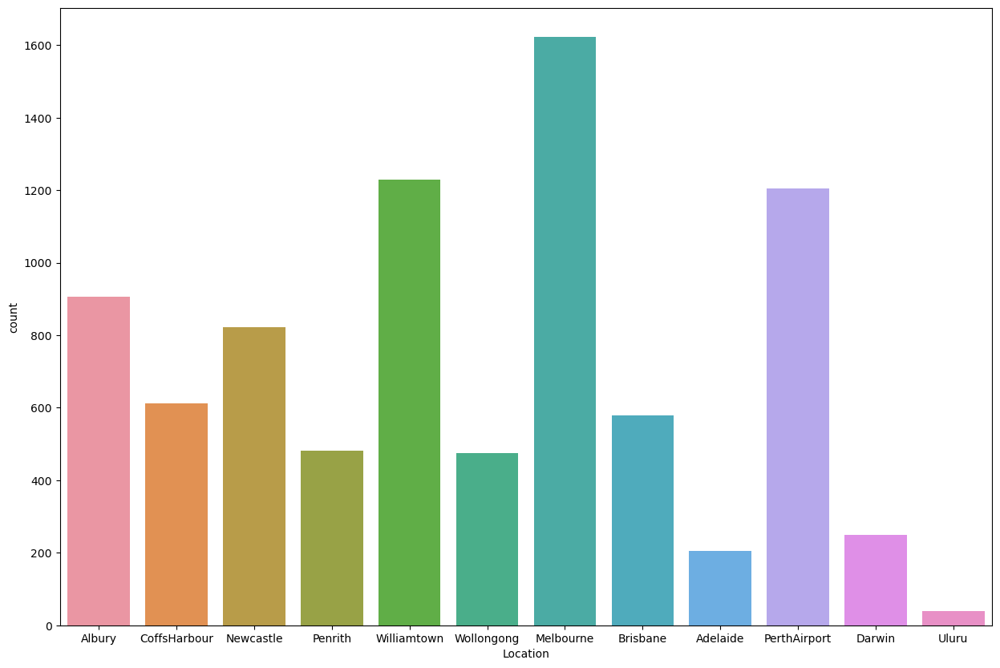

In [15]:
plt.figure(figsize=(15,10))
sns.countplot(x='Location',data=df)
print(df['Location'].value_counts())

<AxesSubplot:>

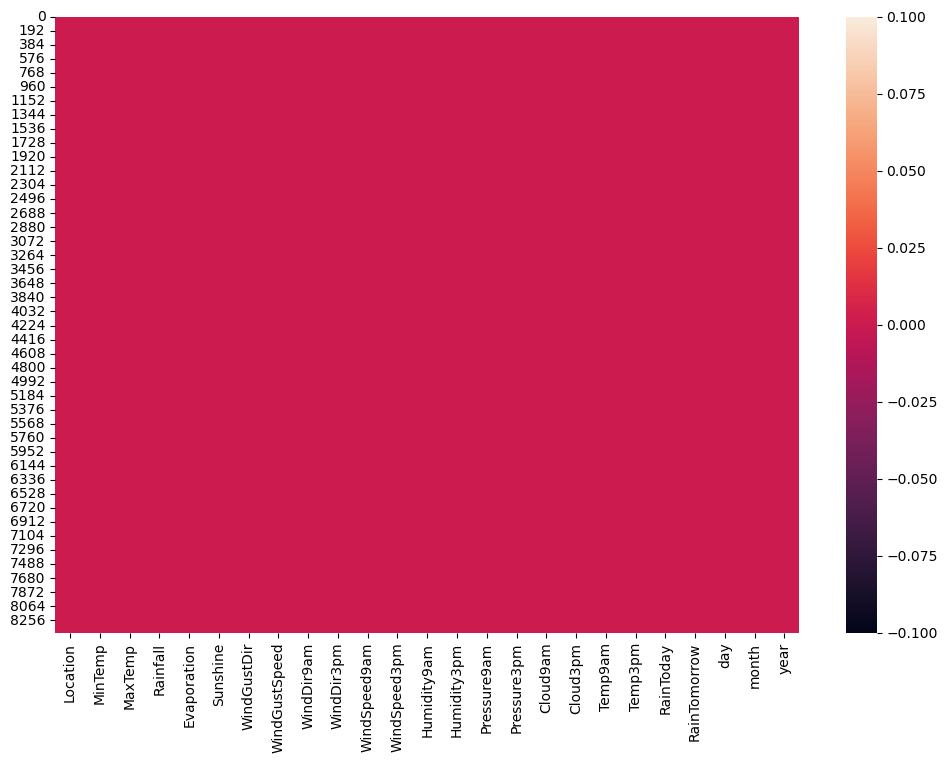

In [16]:
plt.figure(figsize=(12,8))
sns.heatmap(df.isnull())

In [17]:
missing_value= df.isnull().sum().sort_values(ascending=False)
per_missing_value=(missing_value/len(df)*100)
print(pd.concat([missing_value,per_missing_value],axis=1,keys=['Missing value','%Missing value']))

               Missing value  %Missing value
Location                   0             0.0
Humidity3pm                0             0.0
month                      0             0.0
day                        0             0.0
RainTomorrow               0             0.0
RainToday                  0             0.0
Temp3pm                    0             0.0
Temp9am                    0             0.0
Cloud3pm                   0             0.0
Cloud9am                   0             0.0
Pressure3pm                0             0.0
Pressure9am                0             0.0
Humidity9am                0             0.0
MinTemp                    0             0.0
WindSpeed3pm               0             0.0
WindSpeed9am               0             0.0
WindDir3pm                 0             0.0
WindDir9am                 0             0.0
WindGustSpeed              0             0.0
WindGustDir                0             0.0
Sunshine                   0             0.0
Evaporatio

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8425 non-null   float64
 2   MaxTemp        8425 non-null   float64
 3   Rainfall       8425 non-null   float64
 4   Evaporation    8425 non-null   float64
 5   Sunshine       8425 non-null   float64
 6   WindGustDir    8425 non-null   object 
 7   WindGustSpeed  8425 non-null   float64
 8   WindDir9am     8425 non-null   object 
 9   WindDir3pm     8425 non-null   object 
 10  WindSpeed9am   8425 non-null   float64
 11  WindSpeed3pm   8425 non-null   float64
 12  Humidity9am    8425 non-null   float64
 13  Humidity3pm    8425 non-null   float64
 14  Pressure9am    8425 non-null   float64
 15  Pressure3pm    8425 non-null   float64
 16  Cloud9am       8425 non-null   float64
 17  Cloud3pm       8425 non-null   float64
 18  Temp9am 

In [19]:
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['day', 'month', 'year'], float64: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'], object: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']}

In [20]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,day,month,year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,15.741958,6.442136,2012.102433
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,8.787354,3.437994,2.473137
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


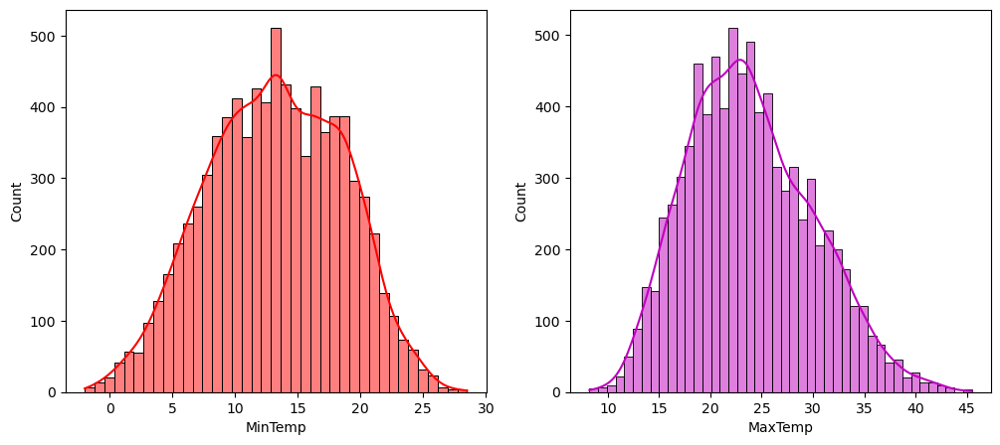

In [21]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['MinTemp'],kde=True,color='r')
plt.subplot(1,2,2)
sns.histplot(df['MaxTemp'],kde=True,color='m')
plt.show()

In [22]:
print('Present Maximum Temperature Maxima in year 2013-2016 :',df.MaxTemp.max())
print('Present Maximum Temperature Minima in year 2013-2016 :',df.MaxTemp.min())
print(' Average Present Maximum Temperature in year 2013-2016 :',df.MaxTemp.mean())
print('='*100)
print('Present Minimum Temperature Maxima in year 2013-2016 :',df.MinTemp.max())
print('Present Minimum Temperature Minima in year 2013-2016 :',df.MinTemp.min())
print('Average Present Minimum Temperature in year 2013-2016 :',df.MinTemp.mean())

Present Maximum Temperature Maxima in year 2013-2016 : 45.5
Present Maximum Temperature Minima in year 2013-2016 : 8.2
 Average Present Maximum Temperature in year 2013-2016 : 23.859976090854737
Present Minimum Temperature Maxima in year 2013-2016 : 28.5
Present Minimum Temperature Minima in year 2013-2016 : -2.0
Average Present Minimum Temperature in year 2013-2016 : 13.193305389221567


Text(0.5, 1.0, 'mintemp vs location')

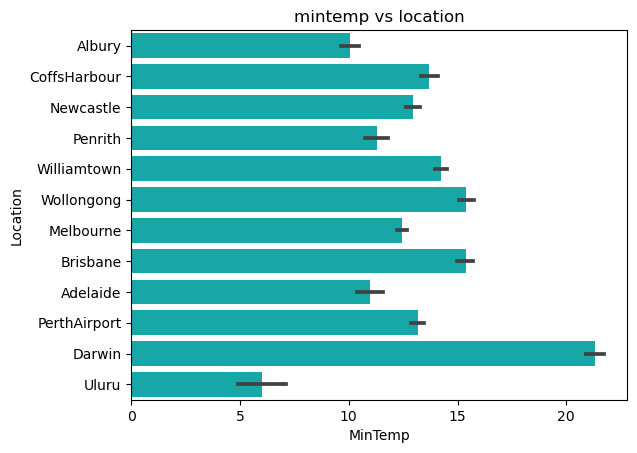

In [23]:
sns.barplot(x='MinTemp',y='Location',data=df,color='c',ci=95)
plt.title("mintemp vs location")

Text(0.5, 1.0, 'mintemp vs location')

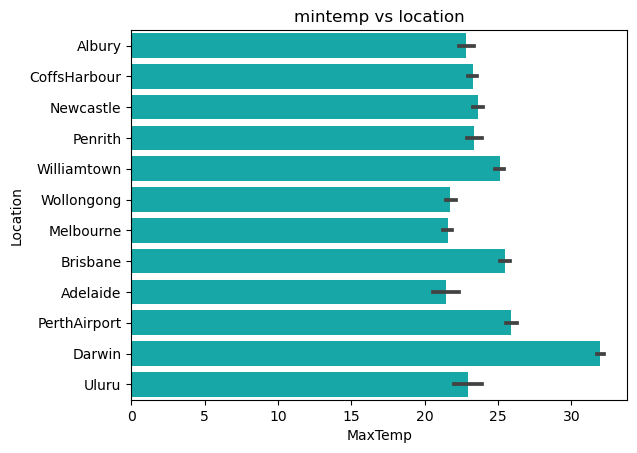

In [24]:
sns.barplot(x='MaxTemp',y='Location',data=df,color='c',ci=95)
plt.title("mintemp vs location")

Text(0.5, 1.0, 'rainfall vs location')

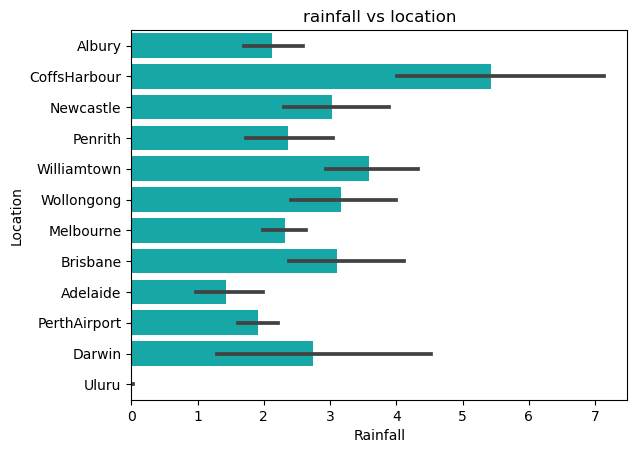

In [25]:
sns.barplot(x='Rainfall',y='Location',data=df,color='c',ci=95)
plt.title("rainfall vs location")

Text(0.5, 1.0, 'WindDir9am')

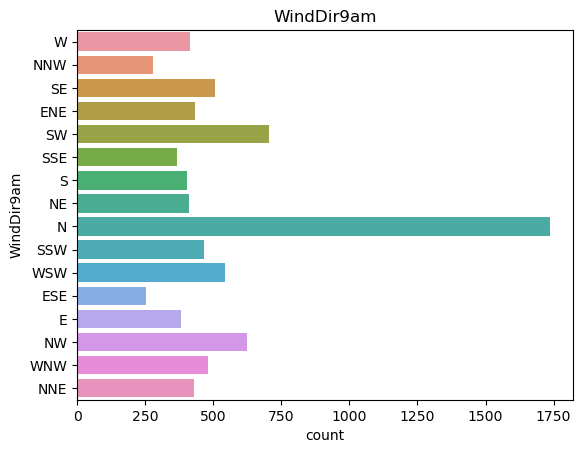

In [26]:
sns.countplot(y='WindDir9am',data=df)
plt.title("WindDir9am")

Text(0.5, 1.0, 'WindDir3pm')

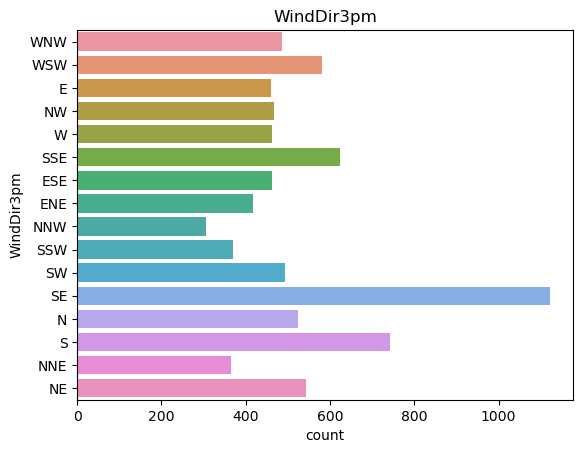

In [27]:
sns.countplot(y='WindDir3pm',data=df)
plt.title("WindDir3pm")

<AxesSubplot:xlabel='RainToday', ylabel='count'>

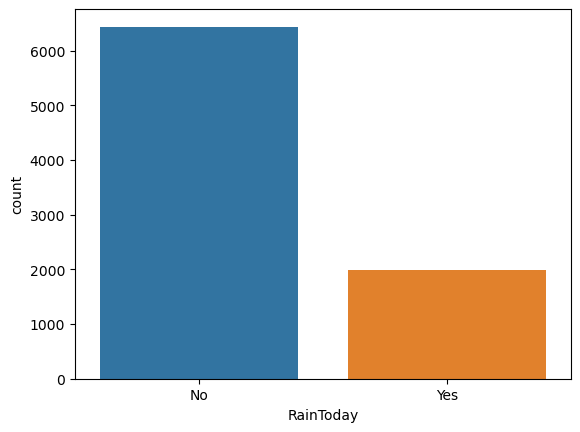

In [28]:
sns.countplot(x='RainToday',data=df)

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

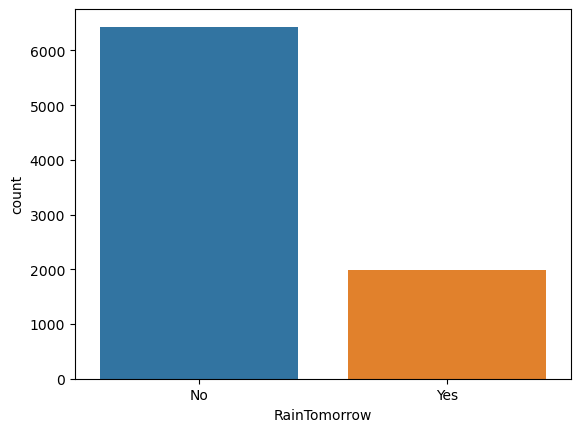

In [29]:
sns.countplot(x='RainTomorrow',data=df)

<AxesSubplot:xlabel='year', ylabel='Rainfall'>

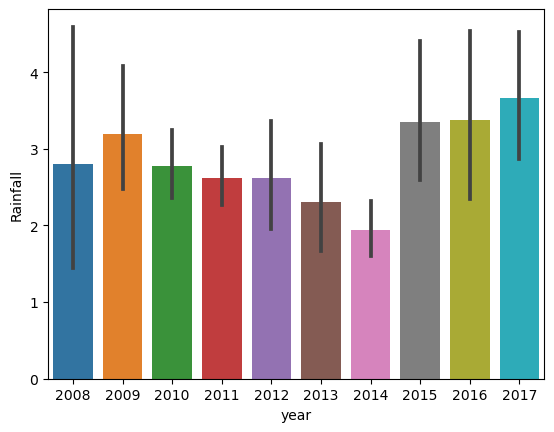

In [30]:
sns.barplot(y='Rainfall',x='year',data=df)

Text(0.5, 1.0, 'rainfall vs year and location')

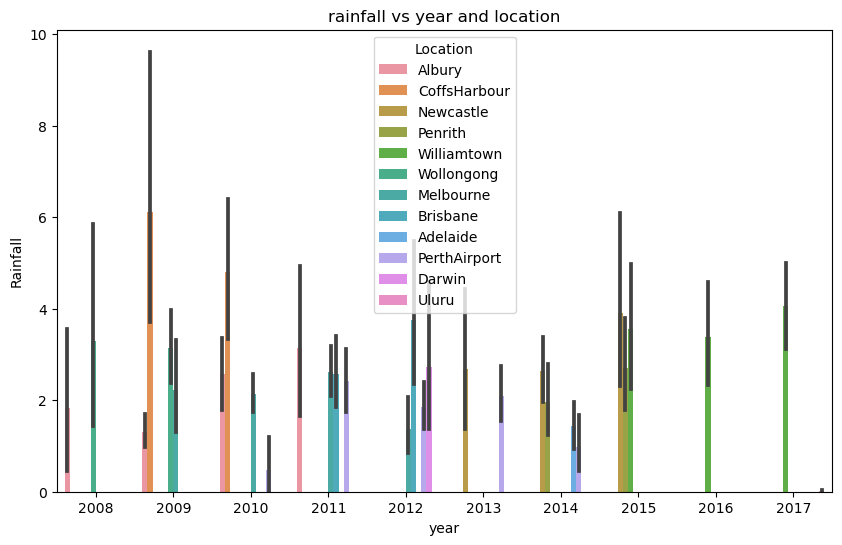

In [31]:
plt.figure(figsize=(10,6))
sns.barplot(y='Rainfall',x='year',data=df,ci=95,hue="Location")
plt.title("rainfall vs year and location")

<AxesSubplot:xlabel='WindDir9am', ylabel='WindDir3pm'>

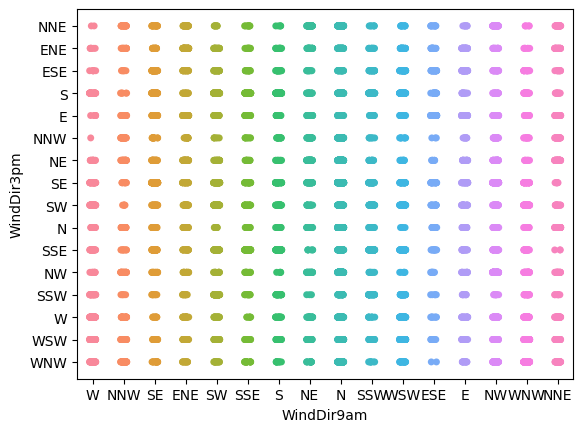

In [32]:
sns.stripplot(x ='WindDir9am', y ='WindDir3pm', data = df,
              jitter = True,  dodge = True)

<AxesSubplot:xlabel='WindDir9am', ylabel='WindDir3pm'>

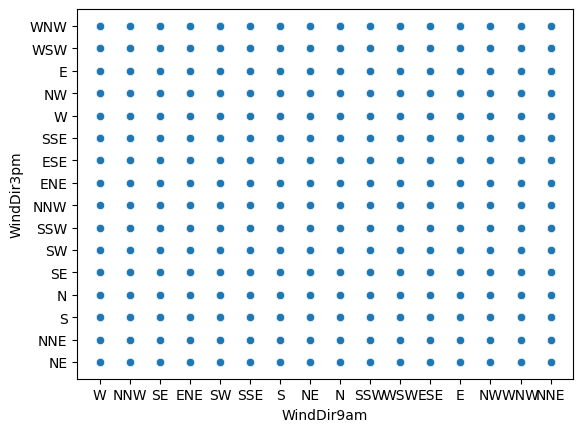

In [33]:
sns.scatterplot(x ='WindDir9am', y ='WindDir3pm', data = df)

<AxesSubplot:xlabel='MaxTemp', ylabel='RainToday'>

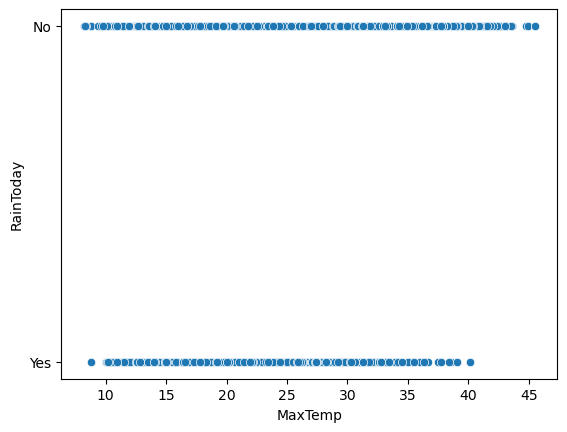

In [34]:
sns.scatterplot(x ='MaxTemp', y ='RainToday', data = df)

<AxesSubplot:xlabel='RainToday', ylabel='MaxTemp'>

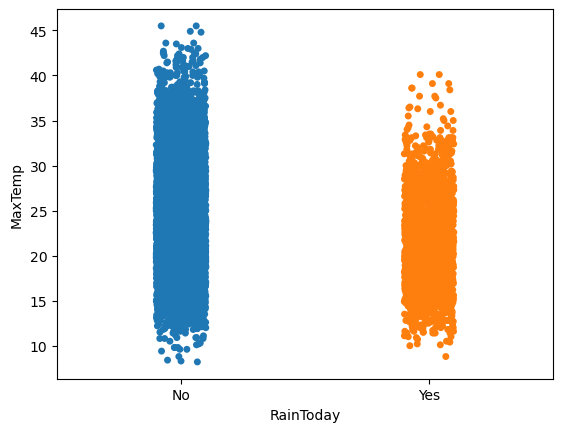

In [35]:
sns.stripplot(y ='MaxTemp', x ='RainToday', data = df,
              jitter = True,  dodge = True)

In [36]:
df['RainTomorrow'].value_counts()

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64

In [37]:
df.shape

(8425, 25)

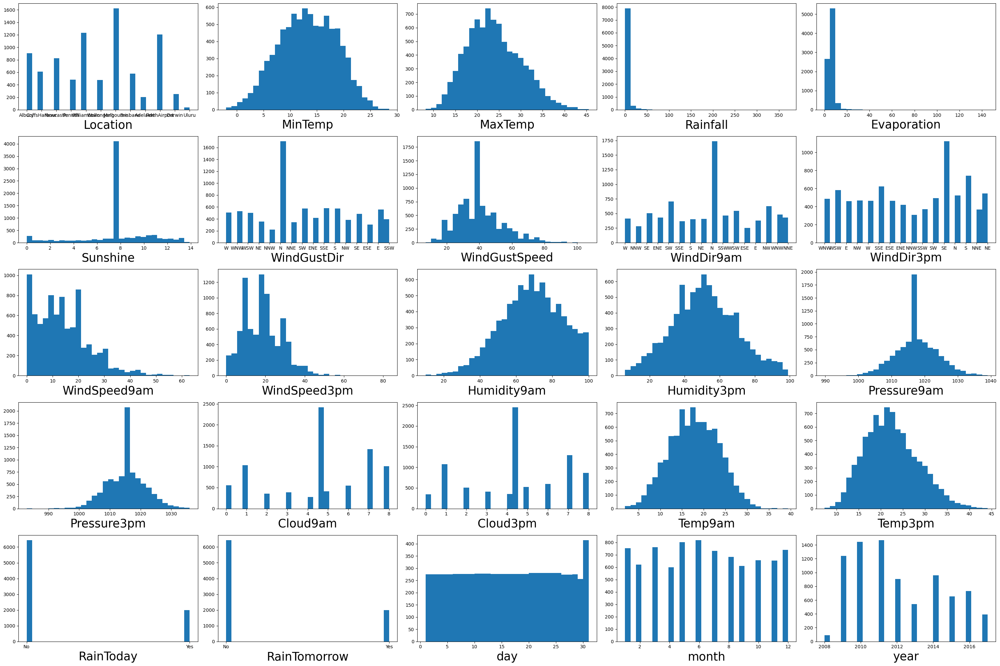

In [38]:
plt.figure(figsize=(30,20))
plotnumber=1

for column in df:
    if plotnumber<=25:
        ax = plt.subplot(5,5,plotnumber)
        plt.hist(df[column],bins=30)
        plt.xlabel(column,fontsize=25)
        
        
        plotnumber+=1
plt.tight_layout()

In [39]:
df.drop(['Location','WindDir9am','WindDir3pm'],axis=1,inplace=True)

In [40]:
df.drop(['WindGustDir'],axis=1,inplace=True)

In [41]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,13.4,22.900000,0.6,5.389395,7.632205,44.000000,20.0,24.0,71.0,22.0,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,7.4,25.100000,0.0,5.389395,7.632205,44.000000,4.0,22.0,44.0,25.0,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,12.9,25.700000,0.0,5.389395,7.632205,46.000000,19.0,26.0,38.0,30.0,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,9.2,28.000000,0.0,5.389395,7.632205,24.000000,11.0,9.0,45.0,16.0,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,17.5,32.300000,1.0,5.389395,7.632205,41.000000,7.0,20.0,82.0,33.0,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,0.0,5.389395,7.632205,31.000000,13.0,11.0,51.0,24.0,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,3.6,25.300000,0.0,5.389395,7.632205,22.000000,13.0,9.0,56.0,21.0,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,5.4,26.900000,0.0,5.389395,7.632205,37.000000,9.0,9.0,53.0,24.0,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,7.8,27.000000,0.0,5.389395,7.632205,28.000000,13.0,7.0,51.0,24.0,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


In [42]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [43]:
df['RainToday'] = le.fit_transform(df['RainToday']) 

In [44]:
le.inverse_transform([0,1])

array(['No', 'Yes'], dtype=object)

In [45]:
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])

In [46]:
le.inverse_transform([0,1])

array(['No', 'Yes'], dtype=object)

In [47]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,13.4,22.9,0.6,5.389395,7.632205,44.0,20.0,24.0,71.0,22.0,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,7.4,25.1,0.0,5.389395,7.632205,44.0,4.0,22.0,44.0,25.0,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,12.9,25.7,0.0,5.389395,7.632205,46.0,19.0,26.0,38.0,30.0,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,9.2,28.0,0.0,5.389395,7.632205,24.0,11.0,9.0,45.0,16.0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,17.5,32.3,1.0,5.389395,7.632205,41.0,7.0,20.0,82.0,33.0,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MinTemp        8425 non-null   float64
 1   MaxTemp        8425 non-null   float64
 2   Rainfall       8425 non-null   float64
 3   Evaporation    8425 non-null   float64
 4   Sunshine       8425 non-null   float64
 5   WindGustSpeed  8425 non-null   float64
 6   WindSpeed9am   8425 non-null   float64
 7   WindSpeed3pm   8425 non-null   float64
 8   Humidity9am    8425 non-null   float64
 9   Humidity3pm    8425 non-null   float64
 10  Pressure9am    8425 non-null   float64
 11  Pressure3pm    8425 non-null   float64
 12  Cloud9am       8425 non-null   float64
 13  Cloud3pm       8425 non-null   float64
 14  Temp9am        8425 non-null   float64
 15  Temp3pm        8425 non-null   float64
 16  RainToday      8425 non-null   int32  
 17  RainTomorrow   8425 non-null   int32  
 18  day     

In [49]:
from sklearn.utils import resample

In [50]:
df_majority = df[(df['RainTomorrow']==0)] 
df_minority = df[(df['RainTomorrow']==1)]

df_minority_upsampled = resample(df_minority, 
                                 replace=True,    
                                 n_samples= 6434, 
                                 random_state=42)  
df_upsampled = pd.concat([df_minority_upsampled, df_majority])

In [51]:
df_upsampled['RainTomorrow'].value_counts()

1    6434
0    6434
Name: RainTomorrow, dtype: int64

In [52]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,13.4,22.9,0.6,5.389395,7.632205,44.0,20.0,24.0,71.0,22.0,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,7.4,25.1,0.0,5.389395,7.632205,44.0,4.0,22.0,44.0,25.0,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,12.9,25.7,0.0,5.389395,7.632205,46.0,19.0,26.0,38.0,30.0,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,9.2,28.0,0.0,5.389395,7.632205,24.0,11.0,9.0,45.0,16.0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,17.5,32.3,1.0,5.389395,7.632205,41.0,7.0,20.0,82.0,33.0,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


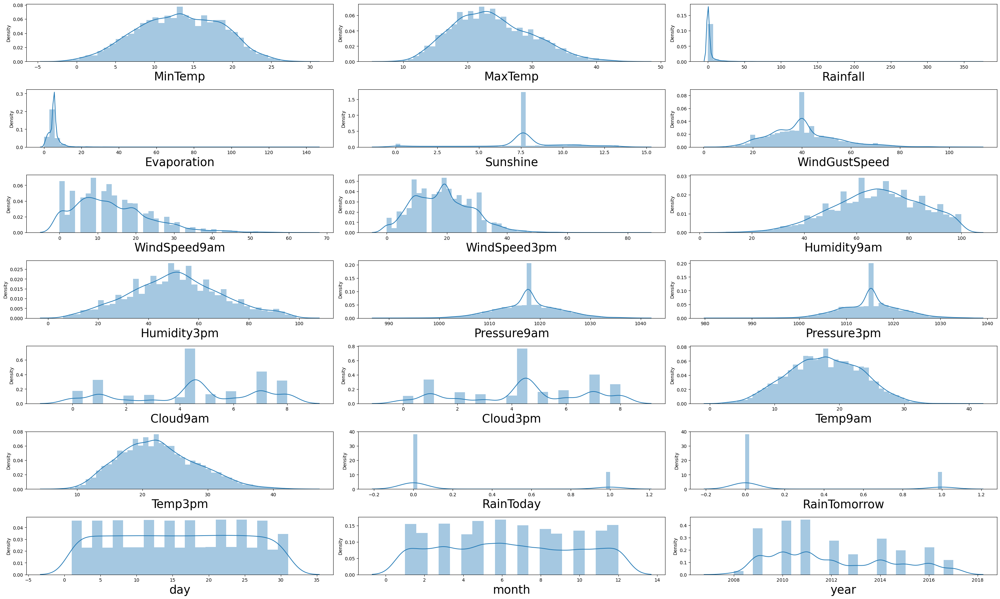

In [53]:
plt.figure(figsize=(30,20))
plotnumber=1

for column in df:
    if plotnumber<=24:
        ax = plt.subplot(8,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=25)
        
        
        plotnumber+=1
plt.tight_layout() 

<Figure size 1500x1500 with 0 Axes>

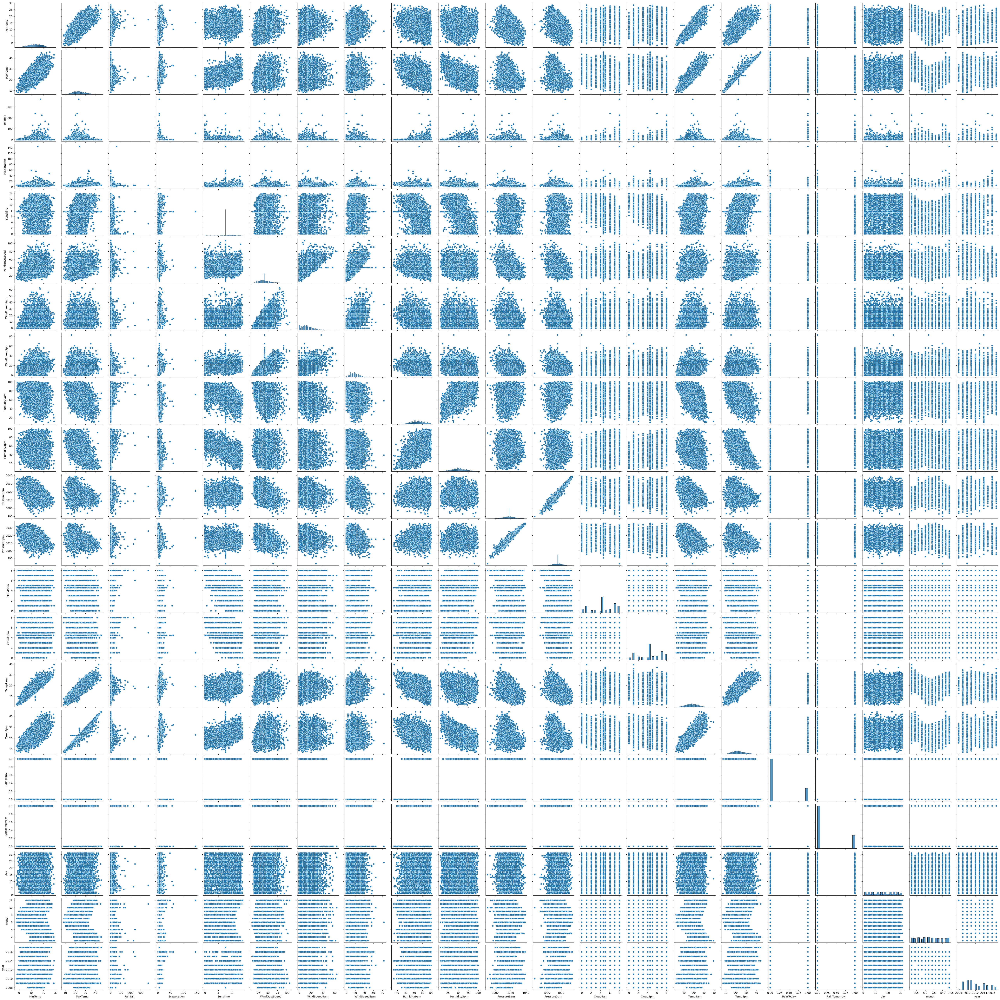

In [54]:
plt.figure(figsize=(15,15))
sns.pairplot(df , palette ='coolwarm')

In [55]:
df.skew()

MinTemp          -0.089989
MaxTemp           0.380654
Rainfall         13.218403
Evaporation      14.023948
Sunshine         -0.716525
WindGustSpeed     0.757000
WindSpeed9am      0.960591
WindSpeed3pm      0.494217
Humidity9am      -0.256743
Humidity3pm       0.118281
Pressure9am      -0.024082
Pressure3pm      -0.010214
Cloud9am         -0.366503
Cloud3pm         -0.276294
Temp9am          -0.014748
Temp3pm           0.397331
RainToday         1.242362
RainTomorrow      1.241588
day               0.004260
month             0.039388
year              0.418663
dtype: float64

In [56]:
sk = df.skew()

In [57]:
sk[np.abs(sk)<0.5].all()

True

In [58]:
df['Rainfall'] =np.sqrt(df['Rainfall'])
df['Evaporation'] = np.sqrt(df['Evaporation'])
df['WindGustSpeed'] = np.sqrt(df['WindGustSpeed'])
df['WindSpeed9am'] = np.sqrt(df['WindSpeed9am'])
df.skew()

MinTemp         -0.089989
MaxTemp          0.380654
Rainfall         2.880118
Evaporation      1.645178
Sunshine        -0.716525
WindGustSpeed    0.176622
WindSpeed9am    -0.414330
WindSpeed3pm     0.494217
Humidity9am     -0.256743
Humidity3pm      0.118281
Pressure9am     -0.024082
Pressure3pm     -0.010214
Cloud9am        -0.366503
Cloud3pm        -0.276294
Temp9am         -0.014748
Temp3pm          0.397331
RainToday        1.242362
RainTomorrow     1.241588
day              0.004260
month            0.039388
year             0.418663
dtype: float64

In [59]:
sk1 = df.skew()

In [60]:
sk1[np.abs(sk1)<0.5].all()

True

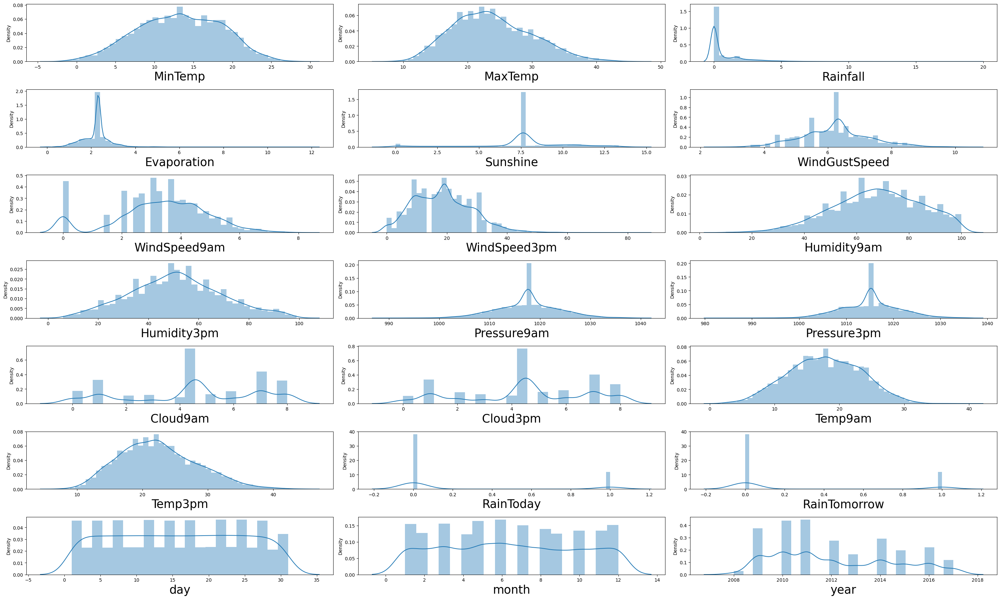

In [61]:
plt.figure(figsize=(30,20))
plotnumber=1

for column in df:
    if plotnumber<=24:
        ax = plt.subplot(8,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=25)
        
        
        plotnumber+=1
plt.tight_layout()

In [62]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,13.4,22.9,0.774597,2.321507,7.632205,6.633250,4.472136,24.0,71.0,22.0,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,7.4,25.1,0.000000,2.321507,7.632205,6.633250,2.000000,22.0,44.0,25.0,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,12.9,25.7,0.000000,2.321507,7.632205,6.782330,4.358899,26.0,38.0,30.0,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,9.2,28.0,0.000000,2.321507,7.632205,4.898979,3.316625,9.0,45.0,16.0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,17.5,32.3,1.000000,2.321507,7.632205,6.403124,2.645751,20.0,82.0,33.0,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


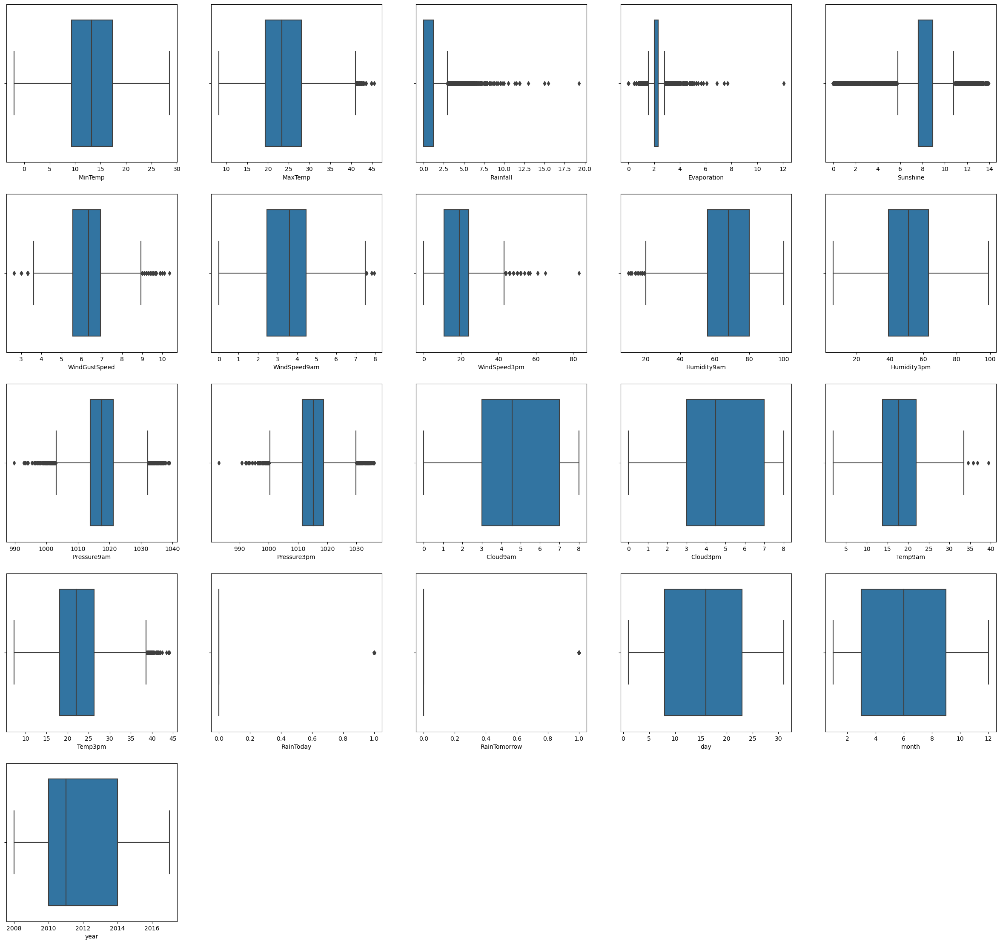

In [63]:
plt.figure(figsize=(30,28))
graph = 1
for column in df:
    if graph<=25:
        ax = plt.subplot(5,5,graph)
        sns.boxplot(df[column],orient='v')
        plt.xlabel(column,fontsize=10)
        
        
        
        graph+=1
plt.show()

In [64]:
from scipy.stats import zscore
z = np.abs(zscore(df))
z.shape

(8425, 21)

In [65]:
threshold = 3
print(np.where(z>3))

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
         62,   67,   68,   68,  123,  296,  296,  381,  381,  405,  406,
        407,  407,  431,  462,  544,  563,  568,  568,  569,  602,  683,
        683,  684,  699,  713,  748,  748,  770,  796,  797,  802,  803,
        928,  935,  949,  951,  979,  980, 1008, 1009, 1011, 1138, 1148,
       1149, 1151, 1187, 1189, 1202, 1203, 1237, 1241, 1264, 1265, 1357,
       1358, 1387, 1411, 1412, 1413, 1479, 1480, 1481, 1501, 1513, 1514,
       1587, 1644, 1661, 1665, 1673, 1680, 1774, 1782, 1811, 1819, 1873,
       1898, 1954, 2028, 2043, 2063, 2108, 2116, 2182, 2183, 2201, 2211,
       2219, 2230, 2231, 2265, 2346, 2373, 2389, 2429, 2488, 2505, 2510,
       2527, 2527, 2541, 2593, 2676, 2677, 2710, 2735, 2738, 2743, 2744,
       2768, 2827, 2835, 2849, 2849, 2855, 2859, 2863, 2869, 2877, 2883,
       2886, 2890, 2891, 2897, 2898, 2900, 2901, 2905, 2909, 2911, 2919,
       2925, 2933, 2939, 2947, 2953, 2961, 2967, 2

In [66]:
data_new = df[(z<3).all(axis = 1)]
print(df.shape)
print(data_new.shape)

(8425, 21)
(8000, 21)


In [67]:
loss_percent = (8425-8115)/8115*100
print(loss_percent)

3.820086260012323


In [68]:
data_new.isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
day              0
month            0
year             0
dtype: int64

In [69]:
data_new.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
0,13.4,22.9,0.774597,2.321507,7.632205,6.633250,4.472136,24.0,71.0,22.0,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,7.4,25.1,0.000000,2.321507,7.632205,6.633250,2.000000,22.0,44.0,25.0,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,12.9,25.7,0.000000,2.321507,7.632205,6.782330,4.358899,26.0,38.0,30.0,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,9.2,28.0,0.000000,2.321507,7.632205,4.898979,3.316625,9.0,45.0,16.0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,17.5,32.3,1.000000,2.321507,7.632205,6.403124,2.645751,20.0,82.0,33.0,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


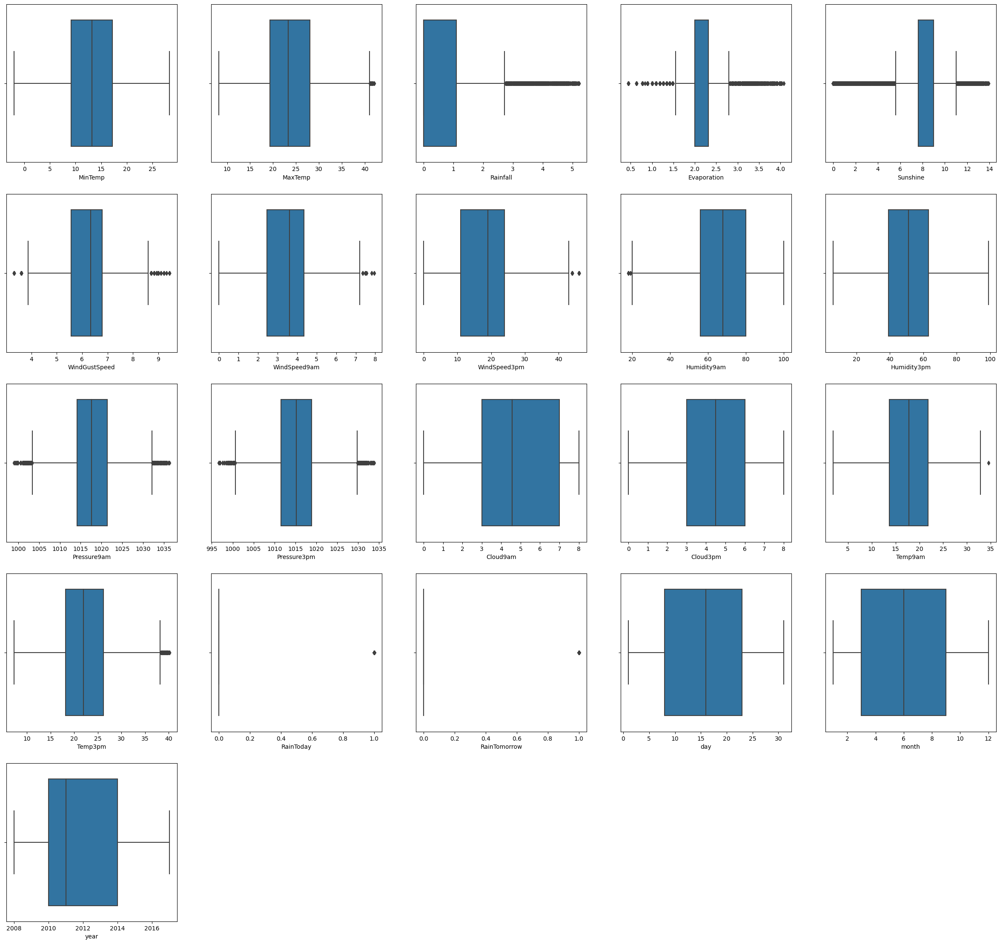

In [70]:
plt.figure(figsize=(30,28))
graph = 1
for column in data_new:
    if graph<=25:
        ax = plt.subplot(5,5,graph)
        sns.boxplot(data_new[column],orient='v')
        plt.xlabel(column,fontsize=10)
        
        
        
        graph+=1
plt.show()

In [71]:
data_new.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,day,month,year
MinTemp,1.000000,0.719201,0.079702,0.370872,0.066602,0.243466,0.168446,0.184760,-0.130782,0.083903,...,-0.424100,0.084669,0.033264,0.888180,0.688129,0.055235,0.087392,0.013595,-0.244441,0.038166
MaxTemp,0.719201,1.000000,-0.207629,0.468849,0.386026,0.151812,0.033547,0.093348,-0.381709,-0.411977,...,-0.410280,-0.254193,-0.248609,0.865133,0.974901,-0.219925,-0.148004,0.020148,-0.164403,0.117987
Rainfall,0.079702,-0.207629,1.000000,-0.164003,-0.232750,0.089452,0.039235,0.036397,0.375775,0.350935,...,-0.039907,0.276918,0.235242,-0.084055,-0.217348,0.849608,0.309899,-0.016186,0.015075,0.015270
Evaporation,0.370872,0.468849,-0.164003,1.000000,0.375537,0.186844,0.072794,0.090168,-0.315327,-0.226172,...,-0.275559,-0.110102,-0.138877,0.439497,0.455699,-0.167926,-0.084717,0.011516,-0.051340,0.136649
Sunshine,0.066602,0.386026,-0.232750,0.375537,1.000000,0.014991,-0.005693,0.042826,-0.358134,-0.435673,...,-0.055034,-0.528874,-0.543061,0.260023,0.402699,-0.215733,-0.316223,0.004937,-0.005594,0.056151
WindGustSpeed,0.243466,0.151812,0.089452,0.186844,0.014991,1.000000,0.525975,0.638663,-0.289083,-0.101485,...,-0.341706,0.005142,0.063573,0.216913,0.118030,0.066035,0.170281,0.000419,0.051314,-0.027226
WindSpeed9am,0.168446,0.033547,0.039235,0.072794,-0.005693,0.525975,1.000000,0.548855,-0.378678,-0.104922,...,-0.119492,-0.008264,0.041073,0.145952,0.016930,0.029984,0.058448,-0.008198,0.036760,-0.108711
WindSpeed3pm,0.184760,0.093348,0.036397,0.090168,0.042826,0.638663,0.548855,1.000000,-0.253690,-0.087971,...,-0.187130,0.002478,0.001611,0.189320,0.071543,0.016679,0.045283,-0.008026,0.040194,-0.063818
Humidity9am,-0.130782,-0.381709,0.375775,-0.315327,-0.358134,-0.289083,-0.378678,-0.253690,1.000000,0.625132,...,0.171253,0.398158,0.291988,-0.372059,-0.375149,0.355391,0.259531,0.005238,-0.112134,0.106736
Humidity3pm,0.083903,-0.411977,0.350935,-0.226172,-0.435673,-0.101485,-0.104922,-0.087971,0.625132,1.000000,...,0.066116,0.411736,0.431974,-0.119790,-0.481289,0.336483,0.437480,0.015823,-0.069907,-0.029217


<AxesSubplot:>

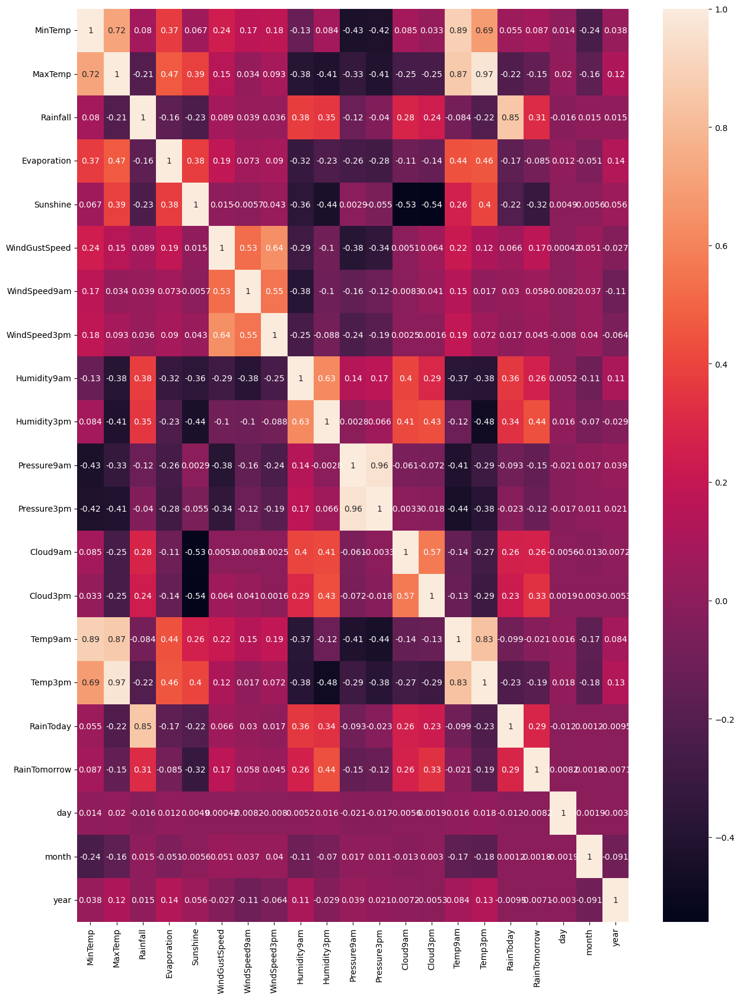

In [72]:
plt.figure(figsize=(15,20))
sns.heatmap(data_new.corr(),annot=True)

In [73]:
x = df.drop(['RainTomorrow'],axis=1)
y = df['RainTomorrow']

In [74]:
x.drop(['Temp3pm','Pressure9am','MaxTemp'],axis=1,inplace=True)

In [75]:
from sklearn.preprocessing import StandardScaler

In [76]:
sc = StandardScaler()

In [77]:
x_scaled = sc.fit_transform(x)

In [78]:
x_scaled.shape[1]

17

In [79]:
vif = pd.DataFrame()

In [80]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

In [81]:
vif['vif'] = [variance_inflation_factor(x_scaled,i) for i in range(x_scaled.shape[1])]

In [82]:
vif['features'] = x.columns

In [83]:
vif

,vif,features
0,8.276162,MinTemp
1,2.790159,Rainfall
2,1.403383,Evaporation
3,1.880388,Sunshine
4,2.149904,WindGustSpeed
5,1.826569,WindSpeed9am
6,1.924086,WindSpeed3pm
7,3.061264,Humidity9am
8,2.107283,Humidity3pm
9,1.423552,Pressure3pm


In [84]:
x.head()

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,day,month,year
0,13.4,0.774597,2.321507,7.632205,6.633250,4.472136,24.0,71.0,22.0,1007.1,8.000000,4.503183,16.9,0,1,12,2008
1,7.4,0.000000,2.321507,7.632205,6.633250,2.000000,22.0,44.0,25.0,1007.8,4.566622,4.503183,17.2,0,2,12,2008
2,12.9,0.000000,2.321507,7.632205,6.782330,4.358899,26.0,38.0,30.0,1008.7,4.566622,2.000000,21.0,0,3,12,2008
3,9.2,0.000000,2.321507,7.632205,4.898979,3.316625,9.0,45.0,16.0,1012.8,4.566622,4.503183,18.1,0,4,12,2008
4,17.5,1.000000,2.321507,7.632205,6.403124,2.645751,20.0,82.0,33.0,1006.0,7.000000,8.000000,17.8,0,5,12,2008


In [85]:
from sklearn.feature_selection import SelectKBest,f_classif

In [86]:
best_features = SelectKBest(score_func=f_classif,k=17)
fit = best_features.fit(x,y)
x_scores = pd.DataFrame(fit.scores_)
x_columns = pd.DataFrame(x.columns)

In [87]:
feature_scores = pd.concat([x_scores,x_columns],axis=1)
feature_scores.columns = ['Score','Feature_Name']

In [88]:
print(feature_scores.nlargest(17,'Score'))

          Score   Feature_Name
8   2077.580374    Humidity3pm
11  1133.279550       Cloud3pm
3   1013.558821       Sunshine
1   1010.994442       Rainfall
13   914.359293      RainToday
10   710.684993       Cloud9am
7    668.806828    Humidity9am
4    293.095720  WindGustSpeed
9    156.930342    Pressure3pm
0     73.393560        MinTemp
2     50.343025    Evaporation
5     35.026406   WindSpeed9am
6     24.239735   WindSpeed3pm
12     4.540288        Temp9am
14     2.013973            day
16     1.031535           year
15     0.013013          month


In [89]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [90]:
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x_scaled,y,test_size=.30, random_state=i)
    mod = LogisticRegression()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum accuracy score is ",maxAccu," on Random_state ",maxRS)

Maximum accuracy score is  0.8457278481012658  on Random_state  63


In [91]:
confusion_mat = confusion_matrix(y_test,pred)

In [92]:
confusion_mat

array([[1817,  113],
       [ 325,  273]], dtype=int64)

In [93]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1930
           1       0.71      0.46      0.55       598

    accuracy                           0.83      2528
   macro avg       0.78      0.70      0.72      2528
weighted avg       0.81      0.83      0.81      2528



In [94]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

83.58386075949366
[[1713  217]
 [ 198  400]]
              precision    recall  f1-score   support

           0       0.90      0.89      0.89      1930
           1       0.65      0.67      0.66       598

    accuracy                           0.84      2528
   macro avg       0.77      0.78      0.78      2528
weighted avg       0.84      0.84      0.84      2528



In [95]:
from sklearn.ensemble import RandomForestClassifier
rr = RandomForestClassifier()
rr.fit(x_train,y_train)
pred = rr.predict(x_test)
print(accuracy_score(y_test,pred)*100)
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

88.05379746835443
[[1857   73]
 [ 229  369]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.92      1930
           1       0.83      0.62      0.71       598

    accuracy                           0.88      2528
   macro avg       0.86      0.79      0.82      2528
weighted avg       0.88      0.88      0.87      2528



In [96]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(x_train,y_train)
pred = svc.predict(x_test)
print(accuracy_score(y_test,pred)*100)
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

83.9003164556962
[[1842   88]
 [ 319  279]]
              precision    recall  f1-score   support

           0       0.85      0.95      0.90      1930
           1       0.76      0.47      0.58       598

    accuracy                           0.84      2528
   macro avg       0.81      0.71      0.74      2528
weighted avg       0.83      0.84      0.82      2528



In [97]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
y_pred = knn.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

82.31803797468355
[[1800  130]
 [ 317  281]]
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      1930
           1       0.68      0.47      0.56       598

    accuracy                           0.82      2528
   macro avg       0.77      0.70      0.72      2528
weighted avg       0.81      0.82      0.81      2528



In [98]:
from sklearn.ensemble import BaggingClassifier

In [99]:
bagg_knn = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),n_estimators=9,max_samples=0.7,bootstrap=True,random_state=63,oob_score=True)
bagg_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(), max_samples=0.7,
                  n_estimators=9, oob_score=True, random_state=63)

In [100]:
bagg_knn.score(x_test,y_test)

0.8188291139240507

In [101]:
bagg_rf = BaggingClassifier(base_estimator=RandomForestClassifier(),n_estimators=9,max_samples=0.8,bootstrap=True,random_state=63,oob_score=True)
bagg_rf.fit(x_train,y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(), max_samples=0.8,
                  n_estimators=9, oob_score=True, random_state=63)

In [102]:
bagg_rf.score(x_train,y_train)

0.9574359843988469

In [103]:
bagg_rf.score(x_test,y_test)

0.8698575949367089

In [104]:
from sklearn.model_selection import KFold ,cross_val_score

k_f = KFold(n_splits=4,shuffle=True)

k_f

KFold(n_splits=4, random_state=None, shuffle=True)

In [105]:
for train,test in k_f.split([1,2,3,4,5,6,7,8,9,10]):
   print("train = ",train,"test = ",test)

train =  [0 2 4 5 6 7 8] test =  [1 3 9]
train =  [1 3 5 6 7 8 9] test =  [0 2 4]
train =  [0 1 2 3 4 6 7 9] test =  [5 8]
train =  [0 1 2 3 4 5 8 9] test =  [6 7]


In [106]:
cross_val_score(knn,x_scaled,y,cv=10)

array([0.8113879 , 0.80782918, 0.76393832, 0.78647687, 0.83985765,
       0.8432304 , 0.86579572, 0.80047506, 0.81828979, 0.83966746])

In [107]:
cross_val_score(KNeighborsClassifier(),x_scaled,y,cv=5).mean()

0.8003560830860534

In [108]:
cross_val_score(rr,x_scaled,y,cv=10)

array([0.84223013, 0.84460261, 0.79833926, 0.89916963, 0.9940688 ,
       1.        , 0.99287411, 0.92517815, 0.85510689, 0.86342043])

In [109]:
cross_val_score(RandomForestClassifier(),x_scaled,y,cv=5).mean()

0.8544807121661722

In [110]:
cross_val_score(dt,x_scaled,y,cv=10)

array([0.7603796 , 0.71886121, 0.72597865, 0.90510083, 0.9881376 ,
       1.        , 0.98099762, 0.84085511, 0.79216152, 0.78978622])

In [111]:
cross_val_score(DecisionTreeClassifier(),x_scaled,y,cv=5).mean()

0.7962017804154302

In [112]:
cross_val_score(mod,x_scaled,y,cv=10)

array([0.85172005, 0.85053381, 0.77698695, 0.78054567, 0.80189798,
       0.79572447, 0.81828979, 0.82304038, 0.86460808, 0.86342043])

In [113]:
cross_val_score(LogisticRegression(),x_scaled,y,cv=10).mean()

0.8226767595652896

In [114]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

In [115]:
parameters = {'criterion':{"gini", "entropy"},
             'max_features':['auto', 'sqrt', 'log2'],
             'n_estimators':int,
             'max_depth':int}

In [116]:
RandomForest = RandomForestClassifier(criterion = 'gini', max_features = 'log2')
RandomForest.fit(x_train,y_train)
RandomForest.score(x_train,y_train)

pred_decision = RandomForest.predict(x_test)
RandomForestS = accuracy_score(y_test,pred_decision)
print('accuracy Score:', RandomForestS*100)

RandomForestScore = cross_val_score(RandomForest,x,y,cv = 5)
RandomForestC = RandomForestScore.mean()
print("Cross Val Score:",RandomForestC*100)

accuracy Score: 88.13291139240506
Cross Val Score: 85.55489614243325


In [117]:
clf = RandomForestClassifier()

In [118]:
params= {'n_estimators':[13,15],
        'criterion':['entropy','gini'],
        'max_depth':[10,15],
        'min_samples_split':[10,11],
        'min_samples_leaf':[5,6]}

In [119]:
grid = GridSearchCV(clf,param_grid=params)
grid.fit(x_train,y_train)
print('best_param',grid.best_params_)

best_param {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 5, 'min_samples_split': 10, 'n_estimators': 15}


In [120]:
clf = grid.best_estimator_

In [121]:
clf.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=15, min_samples_leaf=5,
                       min_samples_split=10, n_estimators=15)

In [122]:
y_pred = clf.predict(x_test)

rf_con_mat = confusion_matrix(y_test,y_pred)
rf_con_mat

array([[1848,   82],
       [ 286,  312]], dtype=int64)

In [123]:
accuracy_score(y_test,y_pred)

0.8544303797468354

In [124]:
report = classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1930
           1       0.79      0.52      0.63       598

    accuracy                           0.85      2528
   macro avg       0.83      0.74      0.77      2528
weighted avg       0.85      0.85      0.84      2528



In [125]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.metrics import plot_roc_curve


In [126]:
lr = LogisticRegression()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
kn = KNeighborsClassifier()
svc = SVC()

In [127]:
lr.fit(x_train,y_train)
dt.fit(x_train,y_train)
rf.fit(x_train,y_train)
kn.fit(x_train,y_train)
svc.fit(x_train,y_train)

SVC()

In [128]:
lr.score(x_test,y_test)
dt.score(x_test,y_test)
rf.score(x_test,y_test)
kn.score(x_test,y_test)
svc.score(x_test,y_test)

0.839003164556962

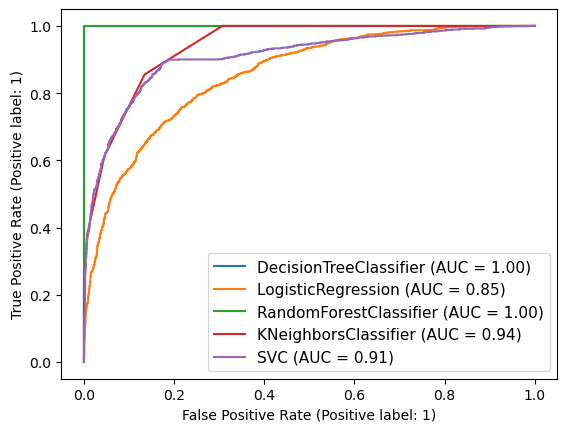

In [131]:
disp = plot_roc_curve(dt,x_train,y_train)

plot_roc_curve(lr,x_train,y_train,ax=disp.ax_)
plot_roc_curve(rf,x_train,y_train,ax=disp.ax_)
plot_roc_curve(kn,x_train,y_train,ax=disp.ax_)
plot_roc_curve(svc,x_train,y_train,ax=disp.ax_)
plt.legend(prop={'size':11},loc='lower right')
plt.show()

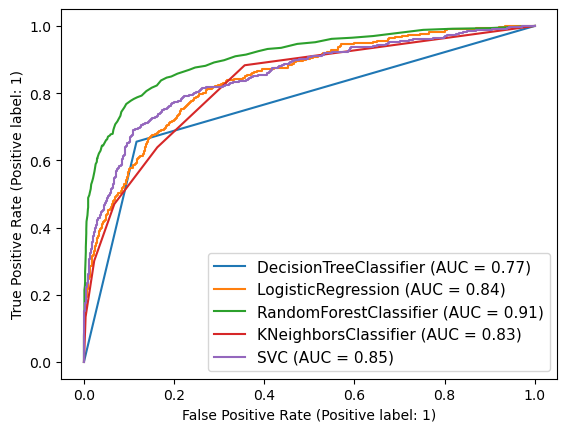

In [132]:
disp = plot_roc_curve(dt,x_test,y_test)

plot_roc_curve(lr,x_test,y_test,ax=disp.ax_)
plot_roc_curve(rf,x_test,y_test,ax=disp.ax_)
plot_roc_curve(kn,x_test,y_test,ax=disp.ax_)
plot_roc_curve(svc,x_test,y_test,ax=disp.ax_)
plt.legend(prop={'size':11},loc='lower right')
plt.show()

In [133]:
import pickle
filename='Rainfall Weather Forecasting'
pickle.dump(grid,open(filename,'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([0, 0, 0, ..., 0, 0, 0])

In [134]:
a =np.array(y_test)
predicted=np.array(grid.predict(x_test))
Rainfall_Weather_Forecasting=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
Rainfall_Weather_Forecasting

,Orginal,Predicted
0,1,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
2523,0,0
2524,0,0
2525,0,0
2526,0,0


In [135]:
model =Rainfall_Weather_Forecasting.to_csv('Rainfall_Weather_Forecasting.csv')
model